In [1]:
import starry
import matplotlib.pyplot as plt
import numpy as np
import pymc3 as pm
import pymc3.math as pmm
import pymc3_ext as pmx
import exoplanet
from starry_process import StarryProcess, MCMCInterface
from starry_process.math import cho_factor, cho_solve
import starry_process 
import theano
import aesara_theano_fallback.tensor as tt
from theano.tensor.slinalg import cholesky
from corner import corner
import arviz as az
from matplotlib.colors import Normalize
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import os
from tqdm import tqdm
import emcee

starry.config.quiet = True
np.random.seed(1)

WARNING (aesara.tensor.blas): Using NumPy C-API based implementation for BLAS functions.
WARNING (theano.tensor.blas): Using NumPy C-API based implementation for BLAS functions.
/opt/anaconda3/envs/starry-env/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Helper functions

In [2]:
def Inclination(name, testval=30):
    """
    An isotropic distribution for inclination angles (in degrees).
    
    """
    def logp(x):
        return tt.log(np.pi / 180 * tt.sin(x * np.pi / 180))

    def random(*args, **kwargs):
        return tt.arccos(pm.Uniform.dist(0, 1).random(*args, **kwargs)) * 180 / np.pi

    return pm.DensityDist(
        name,
        logp,
        random=random,
        testval=testval,
    )


def Angle(*args, **kwargs):
    """
    A uniform distribution for angles in [-180, 180).
    
    """
    if kwargs.get("testval", None) is not None:
        kwargs["testval"] *= np.pi / 180
    return 180 / np.pi * pmx.Angle(*args, **kwargs)


# Shorthand for the usual Uniform distribution
Uniform = pm.Uniform

In [3]:
def generate(t, params, seed=1, error=1e-3, visualize=True):
    """
    Generate a synthetic light curve.
    
    """
    # Set up the system
    map = starry.Map(15, 2)
    map.inc = params["star.inc"]["truth"]
    map[1] = params["star.u1"]["truth"]
    map[2] = params["star.u2"]["truth"]
    star = starry.Primary(map, m=params["star.m"]["truth"]) # *** maybe also `r`
    planet = starry.Secondary(
        starry.Map(),
        inc=params["planet.inc"]["truth"],
        ecc=params["planet.ecc"]["truth"],
        Omega=params["planet.Omega"]["truth"],
        w=params["planet.w"]["truth"],
        porb=params["planet.porb"]["truth"],
        t0=params["planet.t0"]["truth"],
    )
    sys = starry.System(star, planet)
    xo, yo, zo = sys.position(t)
    xo = xo.eval()[1]
    yo = yo.eval()[1]
    zo = zo.eval()[1]
    
    # Get the flux design matrix
    theta = (360 * t / params["star.prot"]["truth"]) % 360
    A = map.design_matrix(
        theta=theta, xo=xo, yo=yo, zo=zo, ro=params["planet.r"]["truth"]
    ).eval()
    print(A.shape)
    
    # *** Draw 1 sample from the GP
    np.random.seed(seed)
    sp = StarryProcess(
        mu=params["gp.mu"]["truth"],
        sigma=params["gp.sigma"]["truth"],
        r=params["gp.r"]["truth"],
        c=params["gp.c"]["truth"],
        n=params["gp.n"]["truth"],
    )
    y = sp.sample_ylm().eval().reshape(-1)

    # Starry process Ylms are normalized so that they have
    # zero luminosity (i.e., a featureless star has Y_{0,0} = 0)
    # Let's renormalize it to unity, since that's the baseline
    # we want for transits
    y[0] += 1
    
    # Compute the light curve
    flux0 = A @ y


    mu_ylm = sp.mean_ylm
    mu_ylm = tt.inc_subtensor(mu_ylm[0], 1)
    mu_flux = tt.dot(A, mu_ylm)
    
    # Add photometric noise
    err = np.ones_like(flux0) * error
    flux = np.array(flux0)
    noise = np.random.randn(len(t)) * err
    flux += noise
    
    # *** Normalize the flux
    med_flux = np.median(flux)
    flux /= med_flux
    err /= med_flux
    
    # Visualize the system
    if visualize:
        fig, ax = plt.subplots(1, 2, figsize=(20, 8))
        idx = (zo > 0) | (xo ** 2 + yo ** 2 > 1)
        ax[0].plot(xo[idx], yo[idx], "k.", ms=1);
        ax[0].set_aspect(1)
        ax[0].axis("off")
        map[:, :] = y
        map.show(ax=ax[0])
        ax[0].set_ylim(-3, 3)
        idx = (zo > 0) & (xo ** 2 + yo ** 2 < 1)
        lat = 180 / np.pi * np.arcsin(yo[idx])
        lon = 180 / np.pi * np.arcsin(xo[idx] / np.sqrt(1 - yo[idx] ** 2)) - theta[idx]
        lon = (lon + 180) % 360 - 180
        mask = np.append(np.array(lon[1:] > lon[:-1], dtype=float), 0)
        mask[mask == 1] = np.nan
        map.show(ax=ax[1], projection="rect")
        ax[1].plot(lon, lat + mask, "k-");
    
    return flux, err, med_flux, mu_flux

Based on Hogg's notes: https://ui.adsabs.harvard.edu/abs/2020arXiv200514199H/abstract,
I have $$ln L_m = -\frac{1}{2} r_m^T \Sigma^{-1} r_m - \frac{1}{2}ln\vert\Sigma\vert - \frac{K}{2} ln(2\pi)$$
$$r_m = f_m - \mu$$
from eq. (19) and (20):
$$\vert\Sigma\vert = \vert\Sigma_d\vert \vert\Sigma_s\vert  \vert\Sigma_s^{-1}\vert \vert\Sigma_s A^T\Sigma_d^{-1} A+I\vert $$
$$\vert\Sigma\vert = \vert\Sigma_d\vert \vert\Sigma_s A^T\Sigma_d^{-1} A+I\vert$$
$$ln \vert\Sigma\vert = ln \vert\Sigma_d\vert + ln \vert\Sigma_s A^T\Sigma_d^{-1} A+I\vert$$
from eq. (24):
$$\Sigma^{-1} = \Sigma_d^{-1} - \Sigma_d^{-1} A (\Sigma_s^{-1}+A^T\Sigma_d^{-1}A)^{-1}A^T\Sigma_d^{-1}$$
$$\Sigma^{-1} = \Sigma_d^{-1} - \Sigma_d^{-1} A (I+\Sigma_s A^T\Sigma_d^{-1}A)^{-1}\Sigma_s A^T\Sigma_d^{-1}$$
$$U = I+\Sigma_s A^T\Sigma_d^{-1}A$$
$$\Sigma^{-1} = \Sigma_d^{-1} - \Sigma_d^{-1} A U^{-1}\Sigma_s A^T\Sigma_d^{-1}$$
$$Q = r_m^T \Sigma^{-1} r_m = r_m^T(\Sigma_d^{-1} - \Sigma_d^{-1} A \Sigma_s U^{-1}A^T\Sigma_d^{-1})r_m$$
$$v = A^T\Sigma_d^{-1}r_m = A^T r_m/\sigma^2$$
$$v^T = r_m^T\Sigma_d^{-1}A$$
$$Q = r_m^T\Sigma_d^{-1}r_m - v^T \Sigma_s U^{-1}v$$

In [4]:
def bin_out_of_transit(t, flux, err, params, dt=0.1, binsize=30):
    """
    Bin the out of transit points to speed things up.
    
    """
    # Find in-transit and out-of-transit points
    idx = np.zeros(len(t), dtype=bool)
    ntransits = int(np.ceil(t[-1] / params["planet.porb"]["truth"]))
    for n in range(ntransits):
        t0 = params["planet.t0"]["truth"] + n * params["planet.porb"]["truth"]
        idx |= ((t > t0 - dt) & (t < t0 + dt))
    t_in = t[idx]
    f_in = flux[idx]
    t_out = t[~idx]
    f_out = flux[~idx]

    # Make the size of the out-of-transit array divisible by binsize
    # so we can bin by simple array reshaping
    trim = len(t_out) % binsize
    t_out = t_out[:-trim]
    f_out = f_out[:-trim]

    # We need to be careful not to bin *across* the transit, so
    # let's NaN-out points right _before_ each transit
    f_out[np.where(np.diff(t_out) > 0.1)] = np.nan

    # Bin the out-of-transit data
    t_out = t_out.reshape(-1, binsize).mean(axis=1)
    f_out = f_out.reshape(-1, binsize).mean(axis=1)

    # Remove any nans (the averages *across* transits)
    idx = np.isnan(f_out)
    t_out = t_out[~idx]
    f_out = f_out[~idx]

    # Error arrays
    e_in = err[0] * np.ones_like(t_in)
    e_out = (err[0] / np.sqrt(binsize)) * np.ones_like(t_out)

    # Sort and merge the arrays
    t_ = np.concatenate((t_in, t_out))
    f_ = np.concatenate((f_in, f_out))
    e_ = np.concatenate((e_in, e_out))
    idx = np.argsort(t_)
    t_ = t_[idx]
    flux_ = f_[idx]
    err_ = e_[idx]

    return t_, flux_, err_

some linear algebra:
$$\Sigma_d^{-1}r_m = r_m\frac{1}{\sigma^2}$$
$$r_m^T\Sigma_d^{-1} = (r_m\frac{1}{\sigma^2})^T$$
$$r_m^T\Sigma_d^{-1}r_m = r_m^2/\sigma^2$$

Solving for mean and covariance of $f_{obs}$
$$m=1/\alpha$$
$$f_{obs} = f_{true}{\alpha}+\epsilon$$
$$f_{true} \sim \mathcal{N}(\mu,\Sigma)$$
$$\epsilon \sim \mathcal{N}(0,\sigma^2 I)$$
$$f_{obs} \sim \mathcal{N}(\frac{\mu}{m},\frac{\Sigma}{m^2}+\sigma^2I)$$
Now, I need to change $\Sigma$:
$$\tilde\Sigma^{-1} = (\frac{1}{m^2}\Sigma)^{-1} = m^2\Sigma^{-1}$$
$$\tilde Q = m^2 Q$$
$$ln\vert\tilde\Sigma\vert = ln\vert\frac{1}{m^2}\Sigma\vert = ln((\frac{1}{m^2})^n\vert\Sigma\vert) = -2n ln(m)+ ln\vert\Sigma\vert$$

In [5]:
def gp_model(t, flux, err, params):

    # Helper function to instantiate parameters
    def parameter(name):
        param = params[name]
        if param.get("free", False):
            args = param.get("args", [])
            kwargs = param.get("kwargs", {})
            testval = param.get("testval", param["truth"])
            return param["dist"](name, *args, testval=testval, **kwargs)
        else:
            return param["truth"]
    
    
    starry.config.lazy = True
    
    with pm.Model() as model:

        # Instantiate the system
        map = starry.Map(15, 2)
        map.inc = parameter("star.inc")
        map[1] = parameter("star.u1")
        map[2] = parameter("star.u2")
        star = starry.Primary(map, m=parameter("star.m")) # *** maybe also `r` for the star
        planet = starry.Secondary(
            starry.Map(),
            inc=parameter("planet.inc"),
            ecc=parameter("planet.ecc"),
            Omega=parameter("planet.Omega"),
            w=parameter("planet.w"),
            porb=parameter("planet.porb"),
            t0=parameter("planet.t0"),
        )
        sys = starry.System(star, planet)
        xo, yo, zo = sys.position(t)

        # Get the flux design matrix
        theta = (360 * t / parameter("star.prot")) % 360
        A = map.design_matrix(
            theta=theta,
            xo=xo[1], # *** these were wrong! [0] = star; [1] = planet
            yo=yo[1],
            zo=zo[1],
            ro=parameter("planet.r"),
        )

        # Instantiate the GP
        # sigma = pm.Uniform("sigma", 1.0, 10.0)
        sp = StarryProcess(
            mu=parameter("gp.mu"),
            sigma=parameter("gp.sigma"),
            # sigma=sigma,
            r=parameter("gp.r"),
            c=parameter("gp.c"),
            n=parameter("gp.n"),
            marginalize_over_inclination=False,  # *** we know the inclination
            normalized=False,  # *** we're modeling the normalization explicitly
        )
        norm = parameter("gp.norm")
        
        A = A / norm
        
        '''
        # Compute the flux covariance
        cov_ylm = sp.cov_ylm
        cov_flux = tt.dot(tt.dot(A, cov_ylm), tt.transpose(A)) / norm ** 2
        cov_flux += tt.diag(err) ** 2

        # Compute the flux mean; remember to offset Y_{0,0} by one
        mu_ylm = sp.mean_ylm
        mu_ylm = tt.inc_subtensor(mu_ylm[0], 1)
        mu_flux = tt.dot(A, mu_ylm) / norm

        # Marginal likelihood
        pm.MvNormal("marginal", mu=mu_flux, cov=cov_flux, observed=flux)
        '''
        Sigma_s = sp.cov_ylm 
        mu_ylm = sp.mean_ylm
        mu_ylm = tt.inc_subtensor(mu_ylm[0], 1)
        mu_flux = tt.dot(A, mu_ylm) #/ norm
        K = len(t)

        U = np.eye(256) +tt.dot(Sigma_s, tt.dot(A.T, A/tt.square(err[:,None])))

        log_sigmadet = 2*tt.sum(tt.log(err)) + pmm.logdet(U) 
        # log_sigmadet -= 2*256*tt.log(norm)

        r = tt.as_tensor_variable(flux) - mu_flux
        v = tt.dot(A.T,(r/tt.square(err)))
        Q = tt.sum(tt.square(r/err)) - tt.dot(v.T,tt.slinalg.solve(U,tt.dot(v,Sigma_s)))

        loglike = -0.5 * Q
        loglike -= 0.5  * log_sigmadet
        loglike -= 0.5 * K * tt.log(2 * np.pi)

        pm.Potential("lnlike", loglike)

        
        return model

## Generate a light curve

(1440, 256)


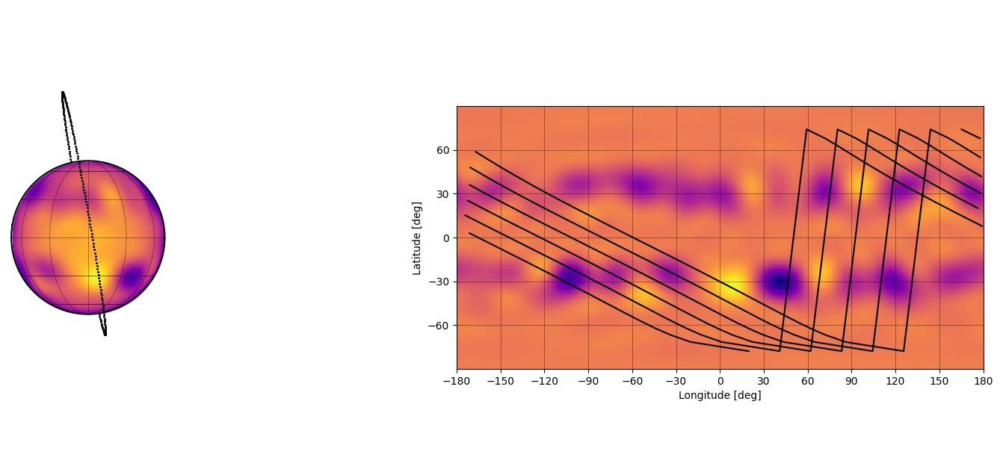

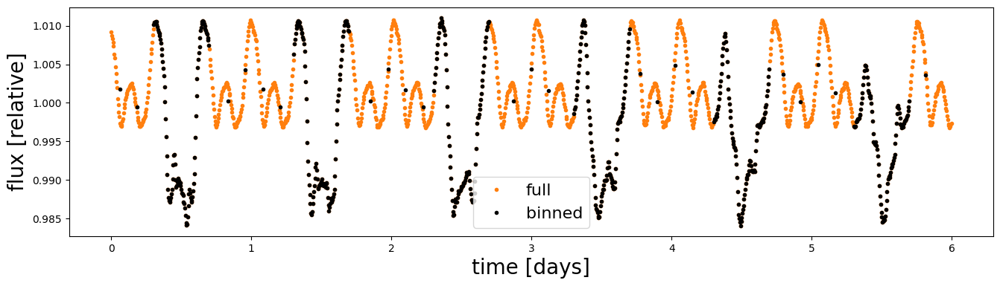

In [6]:
# *** True parameters & priors
params = {
    "planet.inc": {"truth": 88.0, "dist": Inclination},
    "planet.ecc": {"truth": 0.2, "dist": Uniform, "args": [0.0, 0.4]},
    "planet.Omega": {"truth": 100, "dist": Uniform, "args": [-180,180]},
    "planet.w": {"truth": 0.0, "dist": Angle},
    "planet.porb": {"truth": 1.0, "dist": Uniform, "args": [0.975, 1.025]},
    "planet.t0": {"truth": 0.5, "dist": Uniform, "args": [0.475, 0.525]},
    "planet.r": {"truth": 0.1, "dist": Uniform, "args": [0.06, 0.14]},
    "star.inc": {"truth": 90, "dist": Inclination},
    "star.m": {"truth": 0.5, "dist": Uniform, "args": [0.4, 0.6]},
    "star.u1": {"truth": 0.4, "dist": Uniform, "args": [0.0, 0.6]},
    "star.u2": {"truth": 0.2, "dist": Uniform, "args": [0.0, 0.4]},
    "star.prot": {"truth": 0.34, "dist": pm.Uniform, "args": [0.1, 1.0]},
    "gp.r": {"truth": 10, "dist": Uniform, "args": [5.0, 25.0]},
    "gp.c": {"truth": 0.1, "dist": Uniform, "args": [0.01, 0.5]},
    "gp.n": {"truth": 20, "dist": Uniform, "args": [1, 30]},
    "gp.mu": {"truth": 30, "dist": Uniform, "args": [0.0, 80.0]},
    "gp.sigma": {"truth": 5, "dist": Uniform, "args": [1.0, 10]},
    "gp.norm": {"truth": 1, "dist": Uniform, "args": [0.8, 1.2]}
}

# *** Time array (6 days @ 6 min cadence)
t = np.arange(0, 6, 6 / 24 / 60)

# Get the light curve
flux, err, med_flux, mu_flux = generate(t, params, error=1e-4)

# Get the binned light curve
t_, flux_, err_ = bin_out_of_transit(t, flux, err, params, dt=0.2)

# Plot the data
fig, ax = plt.subplots(1, figsize=(16, 4))
ax.plot(t, flux, "C1.", alpha=1, label="full")
ax.plot(t_, flux_, "k.", label="binned")
ax.set_ylabel("flux [relative]", fontsize=20)
ax.set_xlabel("time [days]", fontsize=20)
ax.legend(fontsize=16);

In [7]:
params['gp.norm']['truth'] = med_flux

In [8]:
flux_.shape

(593,)

# Inference

In [9]:
# Set some free params & get the model
p = dict(params)
p["gp.mu"]["free"] = True
p["gp.sigma"]["free"] = True
p["gp.n"]["free"] = True
p["gp.c"]["free"] = True
p["gp.r"]["free"] = True
p["gp.norm"]["free"] = True

p["planet.inc"]["free"] = True
p["planet.ecc"]["free"] = True
p["planet.t0"]["free"] = True
p["planet.r"]["free"] = True
p["planet.w"]["free"] = True
p["planet.Omega"]["free"] = True

free = [x for x in p.keys() if p[x].get("free", False)]
model = gp_model(t_, flux_, err_, p)

In [10]:
from starry_process import MCMCInterface

with model:
    mci = MCMCInterface()

In [11]:
x = mci.optimize()
print(mci.transform(x, varnames=free))

message: Desired error not necessarily achieved due to precision loss.
logp: -4584.938690618452 -> 2480.426440811072


100%|██████████| 1/1 [00:00<00:00, 11.43it/s]

[ 7.55379478e+01  2.26570449e-01  1.19771979e+02 -3.67093380e-01
  5.01988416e-01  9.44857478e-02  9.15489194e+00  4.98619029e-01
  1.98394225e+01  3.13357029e+01  9.99979975e+00  8.02839355e-01]


In [12]:
nwalkers = 30
p0 = mci.get_initial_state(nwalkers)

In [13]:
mci.logp(x)

array(2480.1448519)

### let's compare loglikes between true values and in each chain from emcee

In [24]:
# Helper function to instantiate parameters
def parameter(name):
    param = params[name]
    if param.get("free", False):
        args = param.get("args", [])
        kwargs = param.get("kwargs", {})
        testval = param.get("testval", param["truth"])
        return param["dist"](name, *args, testval=testval, **kwargs)
    else:
        return param["truth"]


starry.config.lazy = True

with pm.Model() as model:

    # Instantiate the system
    map = starry.Map(15, 2)
    map.inc = parameter("star.inc")
    map[1] = parameter("star.u1")
    map[2] = parameter("star.u2")
    star = starry.Primary(map, m=parameter("star.m")) # *** maybe also `r` for the star
    planet = starry.Secondary(
        starry.Map(),
        inc=parameter("planet.inc"),
        ecc=parameter("planet.ecc"),
        Omega=parameter("planet.Omega"),
        w=parameter("planet.w"),
        porb=parameter("planet.porb"),
        t0=parameter("planet.t0"),
    )
    sys = starry.System(star, planet)
    xo, yo, zo = sys.position(t)

    # Get the flux design matrix
    theta = (360 * t / parameter("star.prot")) % 360
    A = map.design_matrix(
        theta=theta,
        xo=xo[1], # *** these were wrong! [0] = star; [1] = planet
        yo=yo[1],
        zo=zo[1],
        ro=parameter("planet.r"),
    )

    # Instantiate the GP
    # sigma = pm.Uniform("sigma", 1.0, 10.0)
    sp = StarryProcess(
        mu=parameter("gp.mu"),
        sigma=parameter("gp.sigma"),
        # sigma=sigma,
        r=parameter("gp.r"),
        c=parameter("gp.c"),
        n=parameter("gp.n"),
        marginalize_over_inclination=False,  # *** we know the inclination
        normalized=False,  # *** we're modeling the normalization explicitly
    )
    norm = parameter("gp.norm")
    
    A = A / norm
        
    
    Sigma_s = sp.cov_ylm 
    mu_ylm = sp.mean_ylm
    mu_ylm = tt.inc_subtensor(mu_ylm[0], 1)
    mu_flux = tt.dot(A, mu_ylm) #/ norm
    K = len(t)

    U = np.eye(256) +tt.dot(Sigma_s, tt.dot(A.T, A/tt.square(err[:,None])))

    log_sigmadet = 2*tt.sum(tt.log(err)) + pmm.logdet(U) 
    # log_sigmadet -= 2*256*tt.log(norm)

    r = tt.as_tensor_variable(flux) - mu_flux
    v = tt.dot(A.T,(r/tt.square(err)))
    Q = tt.sum(tt.square(r/err)) - tt.dot(v.T,tt.slinalg.solve(U,tt.dot(v,Sigma_s)))

    loglike = -0.5 * Q
    loglike -= 0.5  * log_sigmadet
    loglike -= 0.5 * K * tt.log(2 * np.pi)

    lnlike = pm.Potential("lnlike", loglike)


In [25]:
pmx.eval_in_model(lnlike,model=model)

array(5173.34479584)

In [26]:
az_trace = az.from_netcdf('longerlc_128000_gps.andplanets.nc')

In [31]:
samples_fromfile = az_trace.to_dataframe()

In [35]:
az_trace.sample_stats

<xarray.Dataset>
Dimensions:  (chain: 30, draw: 2000)
Coordinates:
  * chain    (chain) int64 0 1 2 3 4 5 6 7 8 9 ... 20 21 22 23 24 25 26 27 28 29
  * draw     (draw) int64 0 1 2 3 4 5 6 7 ... 1993 1994 1995 1996 1997 1998 1999
Data variables:
    lp       (chain, draw) float64 ...
Attributes:
    created_at:                 2023-03-06T20:56:01.120270
    arviz_version:              0.14.0
    inference_library:          emcee
    inference_library_version:  3.1.4

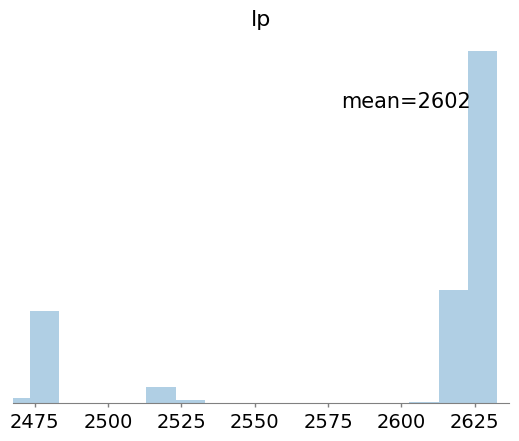

In [37]:
az.plot_posterior(
    az_trace, group="sample_stats", var_names="lp", hdi_prob="hide", kind="hist"
);

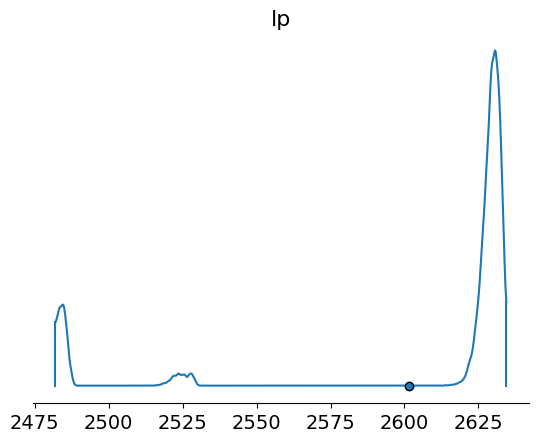

In [39]:
az.plot_density(
    az_trace,
    group="sample_stats",
    var_names="lp",
    point_estimate="mean",
);

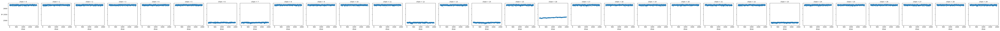

In [44]:
# plt.figure(figsize=(12,6))
az_trace.sample_stats["lp"].plot(col="chain", ls="none", marker=".", alpha=0.3);

In [29]:
samples_fromfile = samples_fromfile.iloc[:, 2:16]

# Sampling
Will's sampling technique:

1. Run for nsteps = 100 steps; look at the $<lnprob>$ over the ensemble at each step; reset.
2. nsteps = 100; look at the autocorrelation estimate. 

In [14]:
import emcee

# Number of parameters
ndim = p0.shape[1]

# Instantiate the sampler
sampler = emcee.EnsembleSampler(nwalkers, ndim, mci.logp)

# Run the chains
np.random.seed(0)
nsteps = 1000
# state = sampler.run_mcmc(p0, nsteps, progress=True, store=True)

In [37]:
max_n = 1000
n_inc = 1

# We'll track how the average autocorrelation time estimate changes
index = 0
ave_logp = np.empty(max_n)

# Now we'll sample for up to max_n steps
for sample in sampler.sample(p0, iterations=max_n, progress=True):
    # Only check convergence every n_inc steps
    if sampler.iteration % n_inc:
        continue
    
    L = sampler.get_log_prob()
    ave_logp[index] = np.mean(L)
    index += 1

100%|██████████| 1000/1000 [17:39<00:00,  1.06s/it]


In [38]:
index

1000

Text(0, 0.5, 'mean logp')

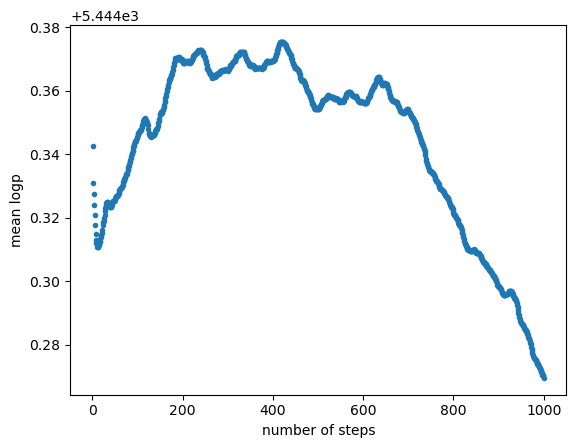

In [39]:
n = np.arange(1, index + 1)
y = ave_logp[:index]
plt.plot(n, y, '.')
plt.xlabel("number of steps")
plt.ylabel('mean logp')

In [28]:
import arviz as az
az.summary(sampler)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
var_0,-0.507,0.032,-0.566,-0.446,0.004,0.003,65.0,219.0,1.17
var_1,0.579,0.782,-0.647,2.168,0.146,0.104,28.0,29.0,1.52
var_2,-1.547,0.301,-2.037,-0.914,0.054,0.039,33.0,40.0,1.39
var_3,-1.059,0.202,-1.459,-0.740,0.027,0.019,62.0,142.0,1.19
var_4,-0.387,0.803,-1.854,1.112,0.111,0.079,50.0,144.0,1.23
var_5,-0.560,0.097,-0.738,-0.379,0.012,0.009,59.0,307.0,1.19


In [15]:
def run_sampler_to_convergence(sampler, xs, nsamp):
    while True:
        sampler.reset()
        sampler.run_mcmc(xs, int(round(nsamp/2)), progress=True)
        xs = sampler.chain[:,-1,:]
        mean_lnprobs = np.mean(sampler.lnprobability, axis=0)

        if mean_lnprobs[-1] < mean_lnprobs[0]:
            break

    # Burned in, at least in the likelihood
    nfac = 1
    while True:
        xs = sampler.chain[:,-1,:]
        sampler.reset()
        sampler.run_mcmc(xs, nsamp, progress=True, thin_by=nfac)

        ac = sampler.get_autocorr_time(quiet=True)

        ac = np.max(ac)

        Nact = nsamp / ac

        if Nact > 50:
            break
        nfac *= 2

    return sampler

In [16]:
sampler.reset()

In [17]:
nsteps=64000

In [18]:
sampler_new = run_sampler_to_convergence(sampler, p0, nsteps)

100%|██████████| 64000/64000 [67:54:42<00:00,  3.82s/it]     


In [22]:
import arviz as az
az.summary(sampler_new)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
var_0,-5.808,1.308,-8.274,-3.710,0.017,0.012,5910.0,6159.0,1.00
var_1,0.936,0.282,0.456,1.448,0.004,0.003,6327.0,7731.0,1.00
var_2,4.801,1.305,2.714,7.236,0.017,0.012,6649.0,8773.0,1.01
var_3,-1.483,0.115,-1.697,-1.272,0.001,0.001,6523.0,10134.0,1.01
var_4,6.192,1.316,4.110,8.687,0.018,0.014,6785.0,5118.0,1.01
var_5,-0.429,0.038,-0.498,-0.358,0.000,0.000,7500.0,20177.0,1.01
var_6,-0.212,0.046,-0.298,-0.126,0.001,0.000,6692.0,18901.0,1.00
var_7,-0.005,0.056,-0.111,0.099,0.001,0.001,3922.0,6278.0,1.01
var_8,-2.766,0.512,-3.760,-1.860,0.009,0.007,3042.0,4681.0,1.01
var_9,3.698,0.599,2.588,4.834,0.007,0.005,7376.0,18355.0,1.00


In [25]:
samples = sampler_new.chain.reshape(-1, ndim)

In [29]:
samples = mci.transform(samples, varnames=free)

100%|██████████| 1920000/1920000 [45:45:51<00:00, 11.65it/s]      


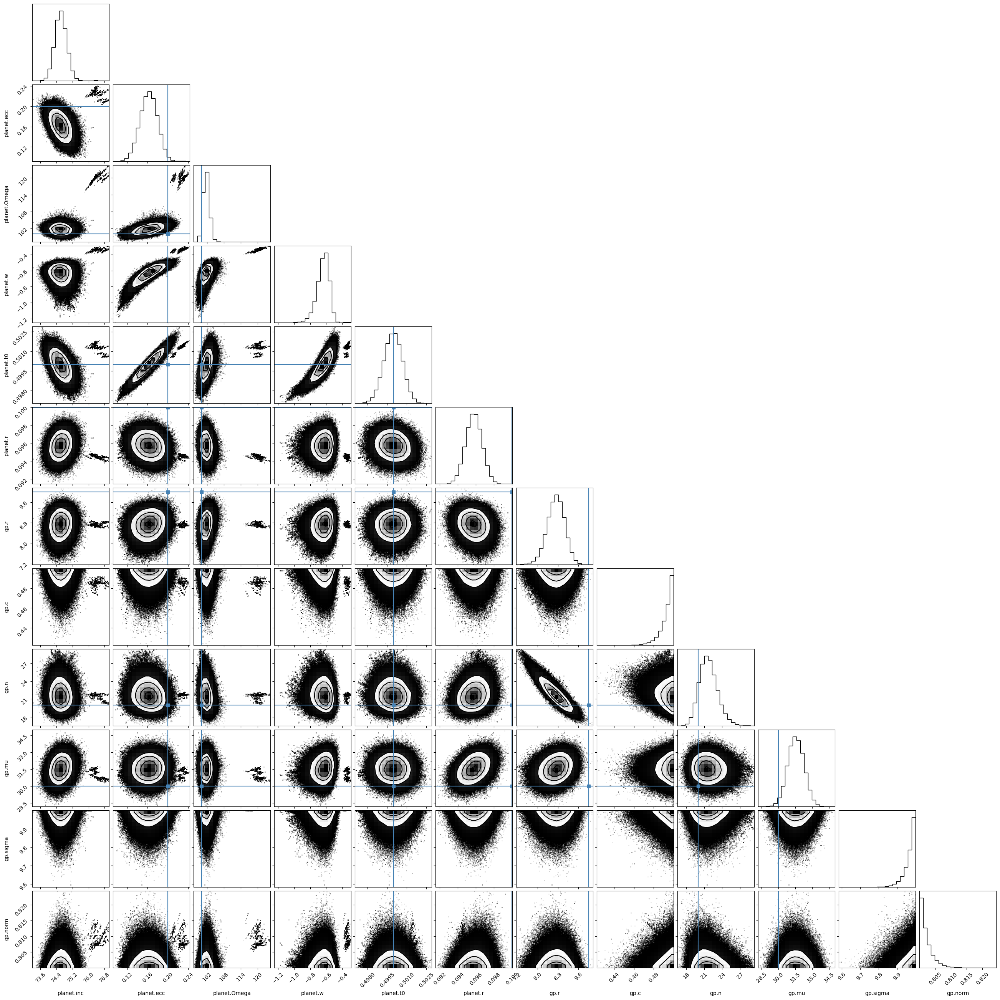

In [30]:
corner(np.array(samples), labels=free, truths=[params[x]["truth"] for x in free]);

In [66]:
samples.shape

(60000, 13)

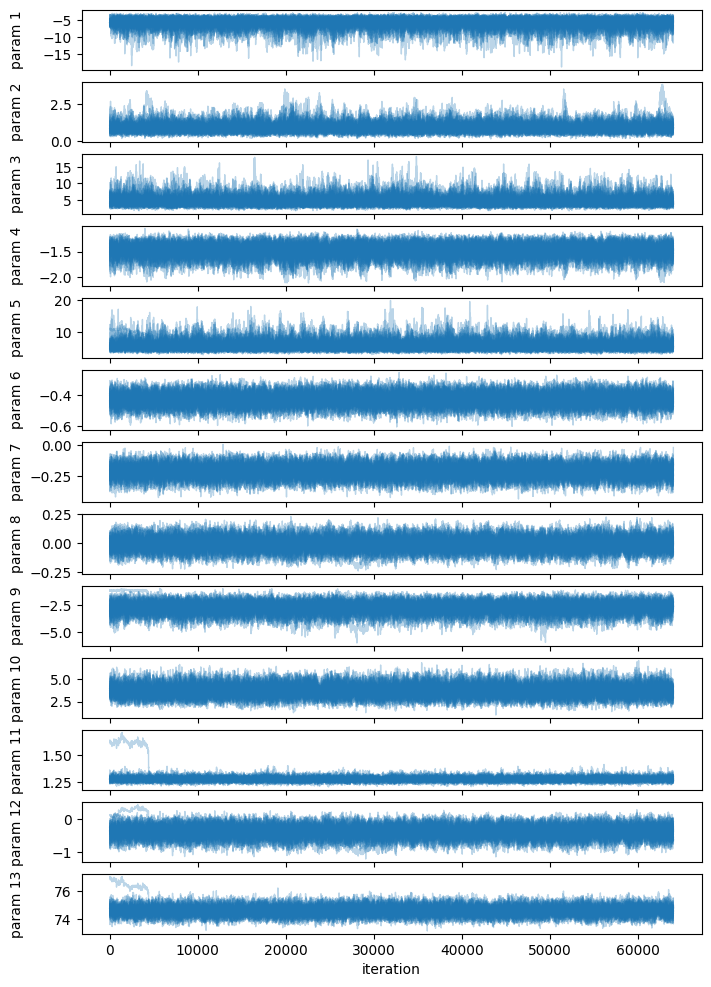

In [27]:
# Plot the walkers
fig, ax = plt.subplots(ndim, figsize=(8, 12), sharex=True)
for j in range(ndim):
    for k in range(nwalkers):
        ax[j].plot(sampler_new.chain[k, :, j], "C0-", lw=1, alpha=0.3)
    ax[j].set_ylabel("param {}".format(j + 1))
ax[-1].set_xlabel("iteration")
fig.align_ylabels(ax)
plt.show()

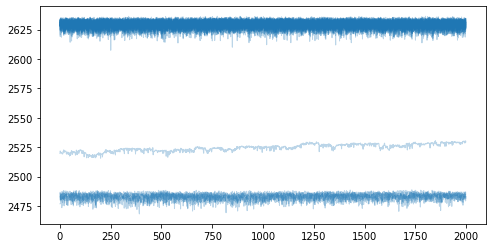

In [47]:
fig, ax = plt.subplots(1, figsize=(8, 4))
for k in range(nwalkers):
    plt.plot(sampler_new.lnprobability[k], "C0-", lw=1, alpha=0.3)

In [28]:
# az.from_pymc3(sampler_new);
az.to_netcdf(sampler_new,'longerlc_64000_gpsandplanets_fixed_porb.nc');

In [31]:
az.to_netcdf(samples,'longerlc_64000_gpsandplanets_fixed_porb_transformed.nc');

/opt/anaconda3/envs/starry-env/lib/python3.8/site-packages/arviz/data/base.py:220: UserWarning: More chains (1920000) than draws (12). Passed array should have shape (chains, draws, *shape)
  warnings.warn(


In [32]:
az_trace = az.from_netcdf('longerlc_64000_gpsandplanets_fixed_porb.nc')

array([[<Axes: title={'center': 'var_0'}>,
        <Axes: title={'center': 'var_0'}>],
       [<Axes: title={'center': 'var_1'}>,
        <Axes: title={'center': 'var_1'}>],
       [<Axes: title={'center': 'var_2'}>,
        <Axes: title={'center': 'var_2'}>],
       [<Axes: title={'center': 'var_3'}>,
        <Axes: title={'center': 'var_3'}>],
       [<Axes: title={'center': 'var_4'}>,
        <Axes: title={'center': 'var_4'}>],
       [<Axes: title={'center': 'var_5'}>,
        <Axes: title={'center': 'var_5'}>],
       [<Axes: title={'center': 'var_6'}>,
        <Axes: title={'center': 'var_6'}>],
       [<Axes: title={'center': 'var_7'}>,
        <Axes: title={'center': 'var_7'}>],
       [<Axes: title={'center': 'var_8'}>,
        <Axes: title={'center': 'var_8'}>],
       [<Axes: title={'center': 'var_9'}>,
        <Axes: title={'center': 'var_9'}>],
       [<Axes: title={'center': 'var_10'}>,
        <Axes: title={'center': 'var_10'}>],
       [<Axes: title={'center': 'var_11'}

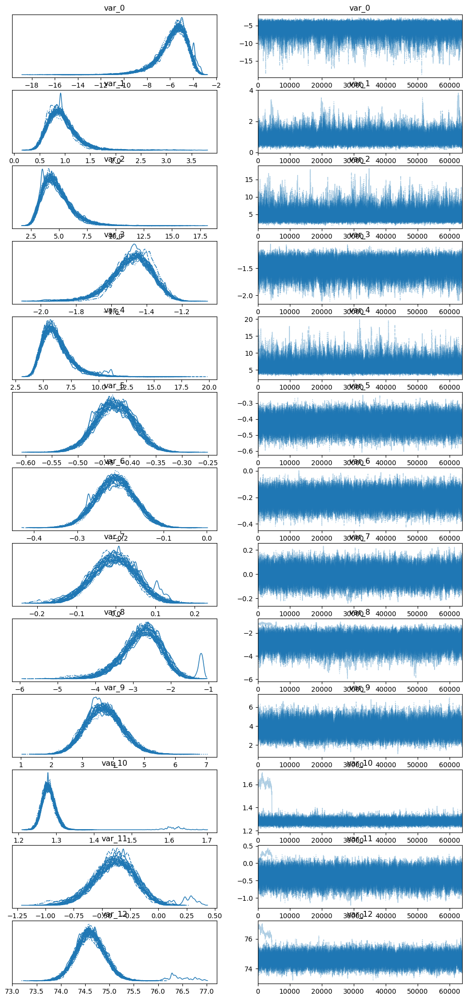

In [33]:
az.plot_trace(az_trace)

In [10]:
samples_fromfile1 = az.from_netcdf('longerlc_64000_gpsandplanets_fixed_porb_transformed.nc')
# transformed samples converted to numpy array for plotting purposes
samples_fromfile1 = samples_fromfile1.posterior.to_array()[0]

In [59]:
params['gp.norm']['truth']

0.9462041781934383

In [58]:
max(np.array(samples_fromfile1).T[11])

0.8243355346548924

In [60]:
use_ranges = [(73,89),(0.1,0.24),(97,105),(-0.001,0.001),(0.498, 0.502),(0.9999,0.100046),(9.88,10.15),(0.4899999,0.5001),(18,22),(29,31),(4.8,9.6),(0.82,0.95)]

KeyboardInterrupt: 

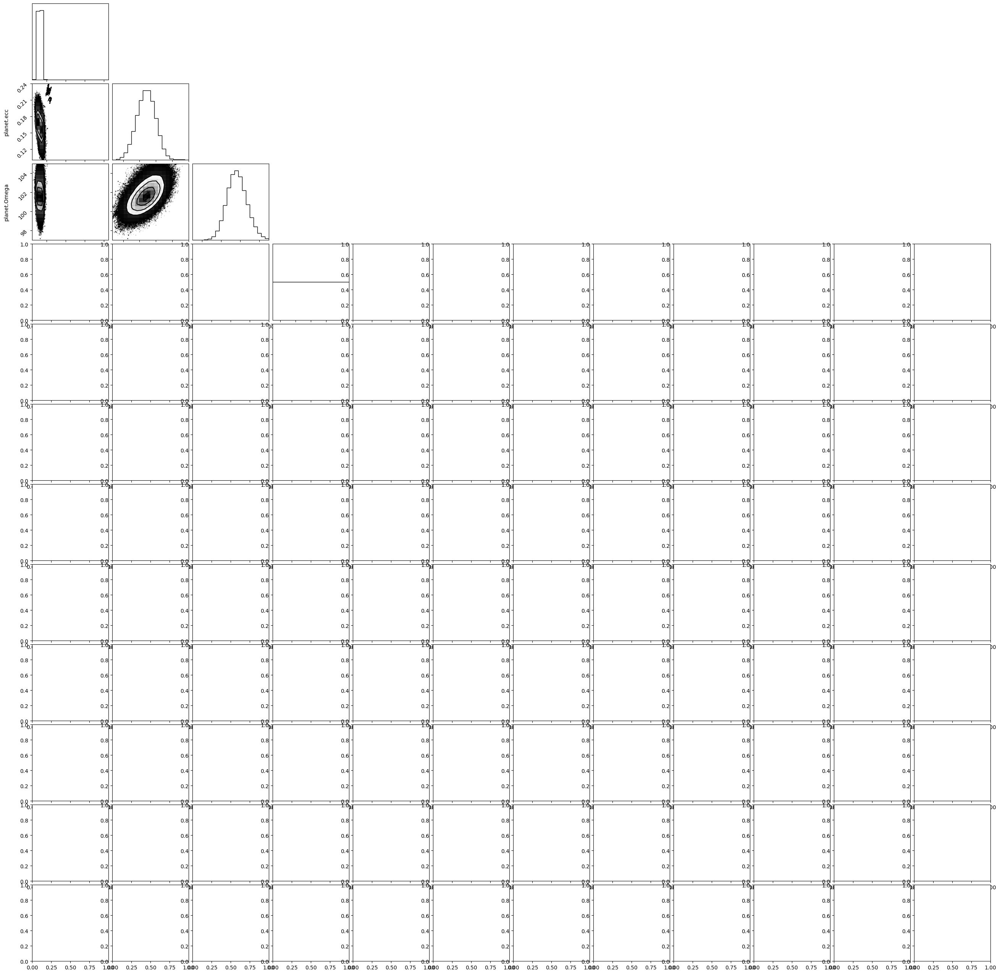

In [62]:
corner(np.array(samples_fromfile1), labels=free, truths=[params[x]["truth"] for x in free], range=use_ranges);

WARNING (theano.link.c.cmodule): A module that was loaded by this ModuleCache can no longer be read from file /Users/sabina/.theano/compiledir_macOS-10.16-x86_64-i386-64bit-i386-3.8.13-64/tmpfddkarb5/m86a1c453e8c2afe2db4b7cdf5d458af4760173b12a1ec13fb2b7554f170b95d9.so... this could lead to problems.
WARNING (theano.link.c.cmodule): A module that was loaded by this ModuleCache can no longer be read from file /Users/sabina/.theano/compiledir_macOS-10.16-x86_64-i386-64bit-i386-3.8.13-64/tmpxu39i8mt/m74150027e78737e865ab55cbe15712ba462149aa3a19b2deca36b066f7288de1.so... this could lead to problems.
WARNING (theano.link.c.cmodule): A module that was loaded by this ModuleCache can no longer be read from file /Users/sabina/.theano/compiledir_macOS-10.16-x86_64-i386-64bit-i386-3.8.13-64/tmpzdnyapti/m7cac4ae9ae8674c7c34648b0b7c6541029292d6c64368e9c49c62745d24a55e1.so... this could lead to problems.
WARNING (theano.link.c.cmodule): A module that was loaded by this ModuleCache can no longer be re

Text(0, 0.5, 'Normalized Flux')

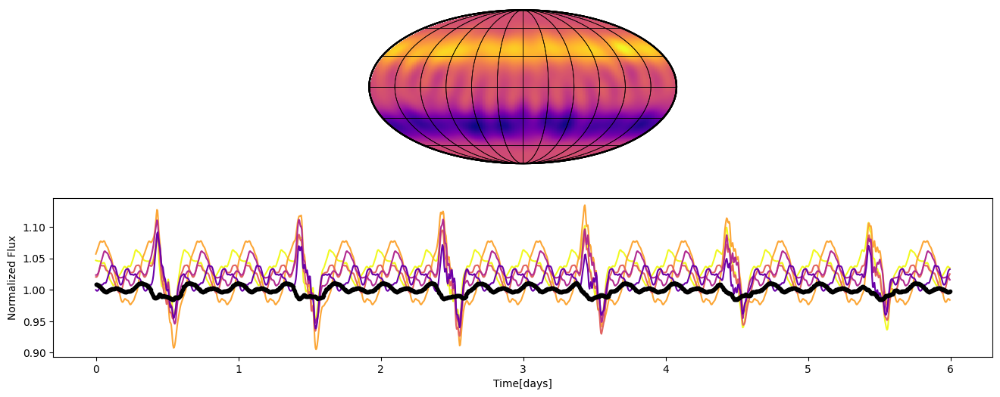

In [35]:
nsamples = 5
norm = Normalize(vmin=0.5, vmax=1.1)
cmap = plt.get_cmap("plasma_r")
map = starry.Map(15,2)

# Draw samples
rand_index = np.random.randint(0,samples_fromfile1.shape[0])

# they should all be drawn from the same sample
sp = StarryProcess(
        mu=np.array(samples_fromfile1)[rand_index,9],
        sigma=np.array(samples_fromfile1)[rand_index,10],
        r=np.array(samples_fromfile1)[rand_index,6],
        c=np.array(samples_fromfile1)[rand_index,7],
        n=np.array(samples_fromfile1)[rand_index,8],
        marginalize_over_inclination=False,  
        normalized=False, 
    )

y = sp.sample_ylm_conditional(t=t, flux=flux, data_cov=err**2, nsamples=nsamples).eval()
fig, ax = plt.subplots(
    2,
    figsize=(16, 6),
)
# Normalize so that the background photosphere
# has unit intensity (for plotting)
y[:, 0] += 1

# y *= np.pi

flux_sys=np.zeros((nsamples,len(t)))
map.inc = params["star.inc"]["truth"]
map[1] = params["star.u1"]["truth"]
map[2] = params["star.u2"]["truth"]

star = starry.Primary(map, m=params["star.m"]["truth"]) 


planet = starry.Secondary(
    starry.Map(),
        inc=np.array(samples_fromfile1)[rand_index,0],
        ecc=np.array(samples_fromfile1)[rand_index,1],
        Omega=np.array(samples_fromfile1)[rand_index,2],
        w=np.array(samples_fromfile1)[rand_index,3],
        porb=params["planet.porb"]["truth"],
        t0=np.array(samples_fromfile1)[rand_index,4],
    )
sys = starry.System(star, planet)
xo, yo, zo = sys.position(t)
xo = xo.eval()[1]
yo = yo.eval()[1]
zo = zo.eval()[1]

theta = (360 * t / params["star.prot"]["truth"]) % 360


for k in range(nsamples):

    map[:,:] = y[k]
    map.show(ax=ax[0], projection="moll")

    # Compute the light curve
    flux_sys = map.flux(theta=theta, xo=xo, yo=yo, zo=zo, ro=np.array(samples_fromfile1)[rand_index,5])

    # *** Normalize the flux
    # flux_sys -= np.mean(flux_sys.eval())
    # flux_sys[k] *= 1e3

    plt.plot(t, flux_sys.eval()/np.array(samples_fromfile1)[rand_index,11], color=cmap(k/5))
    # plt.plot(t,mu_ylm_from_model, color=cmap(k/5))
plt.plot(t,flux,'k.')
plt.xlabel('Time[days]')
plt.ylabel('Normalized Flux')

    

# Dynesty

In [45]:
def ptform(u):  # defines our prior range

    x = np.zeros_like(u)
    
    x[0] = 180 * u[0]    # planet inclination range is from 0 to 180
    x[1] = 0.4 * u[1]  # planet ecc range is from 0 to 0.4
    x[2] = 360 * u[2] - 180  # Omega range is from -180 to 180
    x[3] = 360 * u[3] - 180       # w range is from -180 to 180
    x[4] = 0.05 * u[4] + 0.975       # porb range is from 0.975 to 1.025
    x[5] = 0.05 * u[5] + 0.475          # pt0 range is from 0.475 to 0.525
    x[6] = 0.08 * u[6] + 0.06
    x[7] = 20 * u[7] + 5
    x[8] = 0.49 * u[8] + 0.01
    x[9] = 29 * u[9] + 1
    x[10] = 80 * u[10]
    x[11] = 9 * u[11] + 1
    x[12] = 0.4 * u[12] + 0.8
    
    return np.flip(x)

In [60]:
import dynesty
import emcee

# Number of parameters
ndim = p0.shape[1]

# Run the chains
np.random.seed(0)
nsteps = 1000

# initialize our nested sampler
sampler = dynesty.NestedSampler(mci.logp, ptform, ndim, nlive=1000)
sampler.run_nested()

67920it [67:16:58,  3.57s/it, +1000 | bound: 436 | nc: 1 | ncall: 2223988 | eff(%):  3.100 | loglstar:   -inf < -3621.028 <    inf | logz: -3689.300 +/-  0.280 | dlogz:  0.001 >  1.009]


In [61]:
results = sampler.results

In [65]:
results.samples.shape

(68920, 14)

In [70]:
import arviz as az

In [75]:
az.to_netcdf(results.samples,'samples_dynesty_longlc_gpsandplanet.nc');

/opt/anaconda3/envs/starry-env/lib/python3.8/site-packages/arviz/data/base.py:220: UserWarning: More chains (68920) than draws (14). Passed array should have shape (chains, draws, *shape)
  warnings.warn(


In [154]:
dynesty_fromfile = az.from_netcdf('samples_dynesty_longlc_gpsandplanet.nc')

In [155]:
dynesty_fromfile = dynesty_fromfile.to_dataframe()

In [161]:
dynesty_fromfile[dynesty_fromfile['draw'] == 1]['x']

1         1.074931
15        0.979334
29        0.914920
43        0.876383
57        0.884402
            ...   
964811    0.806096
964825    0.802447
964839    0.803232
964853    0.805873
964867    0.804279
Name: x, Length: 68920, dtype: float64

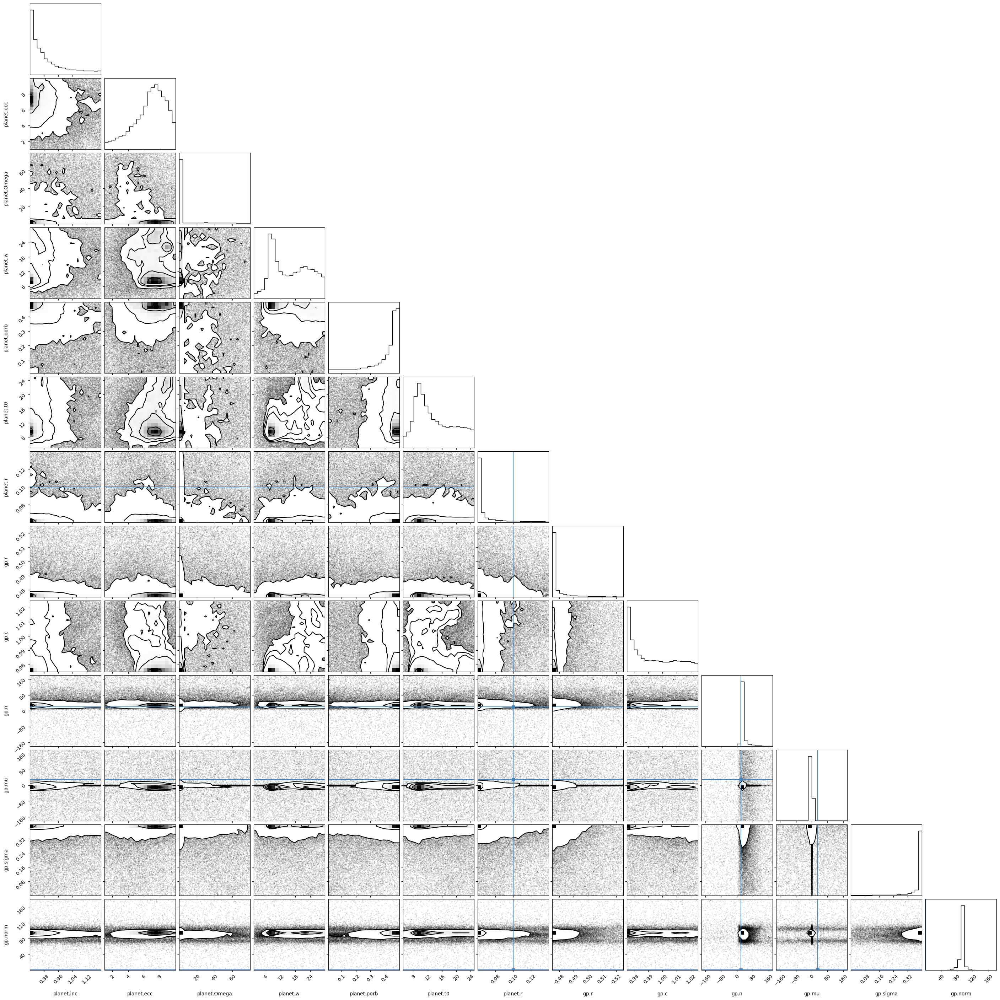

In [84]:
corner(results.samples[:,1:], labels=free, truths=[params[x]["truth"] for x in free],);

# Fixed period